In [1]:
import pandas as pd
import numpy as np
from numpy import math
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error
plt.rcParams['figure.dpi'] = 100

<ipython-input-1-440ed7fa99f1>:3: DeprecationWarning: `np.math` is a deprecated alias for the standard library `math` module (Deprecated Numpy 1.25). Replace usages of `np.math` with `math`
  from numpy import math


In [2]:
# importing Dataset with unicode_escape to avoid unicode Decode error while importing
df = pd.read_csv("/content/SeoulBikeData.csv", encoding = 'unicode_escape')

In [3]:
# inspecting the first 5 rows of data
df.head()

,Date,Rented Bike Count,Hour,Temperature(?),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(?),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,01-12-2017,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,01-12-2017,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,01-12-2017,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,01-12-2017,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,01-12-2017,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes


In [4]:
# inspecting for any null values, data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8760 entries, 0 to 8759
Data columns (total 14 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Date                      8760 non-null   object 
 1   Rented Bike Count         8760 non-null   int64  
 2   Hour                      8760 non-null   int64  
 3   Temperature(?)            8760 non-null   float64
 4   Humidity(%)               8760 non-null   int64  
 5   Wind speed (m/s)          8760 non-null   float64
 6   Visibility (10m)          8760 non-null   int64  
 7   Dew point temperature(?)  8760 non-null   float64
 8   Solar Radiation (MJ/m2)   8760 non-null   float64
 9   Rainfall(mm)              8760 non-null   float64
 10  Snowfall (cm)             8760 non-null   float64
 11  Seasons                   8760 non-null   object 
 12  Holiday                   8760 non-null   object 
 13  Functioning Day           8760 non-null   object 
dtypes: float

In [5]:
# Summary of non numeric datasets
df.describe(include =['object'])


,Date,Seasons,Holiday,Functioning Day
count,8760,8760,8760,8760
unique,365,4,2,2
top,01-12-2017,Spring,No Holiday,Yes
freq,24,2208,8328,8465


In [6]:
 # Checking for unique values of the Holiday Column
df['Holiday'].value_counts()

,count
Holiday,
No Holiday,8328
Holiday,432


In [7]:
# Checking for duplicate values
len(df[df.duplicated()])

0

In [8]:
# Creating variable wiht the name of categorical columns
categorical_variables = df.describe(include = 'object').columns
categorical_variables

Index(['Date', 'Seasons', 'Holiday', 'Functioning Day'], dtype='object')

<ipython-input-17-055a446a85f8>:15: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_sample, x=i, y='Rented Bike Count', ci=None, ax=ax)


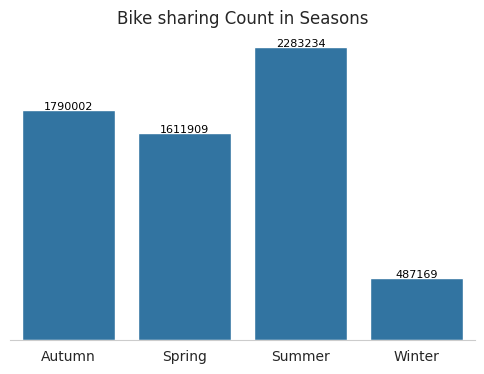

<ipython-input-17-055a446a85f8>:15: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_sample, x=i, y='Rented Bike Count', ci=None, ax=ax)


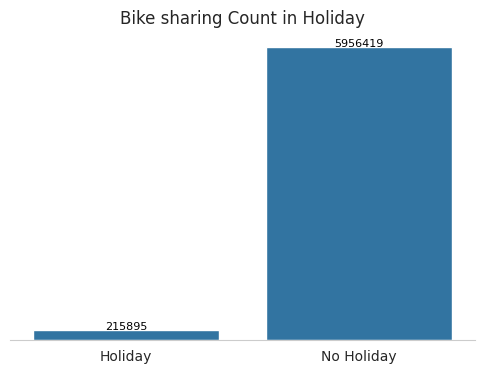

<ipython-input-17-055a446a85f8>:15: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=df_sample, x=i, y='Rented Bike Count', ci=None, ax=ax)


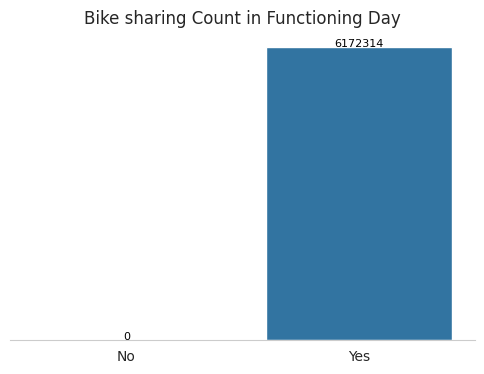

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd  # Assuming you have pandas imported

sns.set_style("whitegrid")

for i in categorical_variables[1:]:
    fig, ax = plt.subplots(figsize=(6, 4))

    # Ensure categorical variable with not more than 5 unique values
    if df[i].nunique() < 5:
        df_sample = df.groupby([i]).sum().reset_index()

        # Select the 'Rented Bike Count' column for plotting (replace with actual column name if different)
        sns.barplot(data=df_sample, x=i, y='Rented Bike Count', ci=None, ax=ax)

        plt.title('Bike sharing Count in ' + i)
        plt.xlabel('')
        plt.ylabel('')
        sns.despine(left=True)
        plt.yticks([])

        for j in range(len(df[i].unique())):
            # Access the 'Rented Bike Count' for each bar (replace with actual column name if different)
            plt.text(x=j, y=df_sample['Rented Bike Count'].iloc[j] + 1000,
                     s=df_sample['Rented Bike Count'].iloc[j],
                     color='black', fontsize=8, horizontalalignment='center')

    plt.show() # Add this line to display the plot for each categorical variable

In [18]:
# Creating function to change the data format of the dataset
import datetime
def conv_dates_series(df, col, old_date_format, new_date_format):

    df[col] = pd.to_datetime(df[col], format=old_date_format).dt.strftime(new_date_format)

    return df

In [20]:
old_date_format = '%d-%m-%Y'   #.... current format of date not compatible for further EDA
new_date_format = "%Y-%m-%d"   #.... new format of date compatible for further EDA

conv_dates_series(df, 'Date', old_date_format, new_date_format)

,Date,Rented Bike Count,Hour,Temperature(?),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(?),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755,2018-11-30,1003,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,Autumn,No Holiday,Yes
8756,2018-11-30,764,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8757,2018-11-30,694,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,Autumn,No Holiday,Yes
8758,2018-11-30,712,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,Autumn,No Holiday,Yes


In [21]:
# Extracting the Date, Month and Year of each Date from Datframe
df['month'] = None
df['year'] = None
df['day'] = None

for i in range(len(df.Date)):
  df['month'][i] = df['Date'][i][5:7]
  df['year'][i]  = df['Date'][i][:4]
  df['day'][i]  = df['Date'][i][8:]

Streaming output truncated to the last 5000 lines.
<ipython-input-21-b79d742a4c7e>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['day'][i]  = df['Date'][i][8:]
<ipython-input-21-b79d742a4c7e>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['month'][i] = df['Date'][i][5:7]
<ipython-input-21-b79d742a4c7e>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['year'][i]  = df['Date'][i][:4]
<ipython-input-21-b79d742a4c7e>:9: Setti

In [22]:
df.head()  # ... inspecting the newly created columns

,Date,Rented Bike Count,Hour,Temperature(?),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(?),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Seasons,Holiday,Functioning Day,month,year,day
0,2017-12-01,254,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,2017,01
1,2017-12-01,204,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,2017,01
2,2017-12-01,173,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,Winter,No Holiday,Yes,12,2017,01
3,2017-12-01,107,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,2017,01
4,2017-12-01,78,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,Winter,No Holiday,Yes,12,2017,01


In [23]:
# Visualzing total Bikes rented in each month
df_by_month = df.groupby(['month']).sum().reset_index().iloc[:,:2]

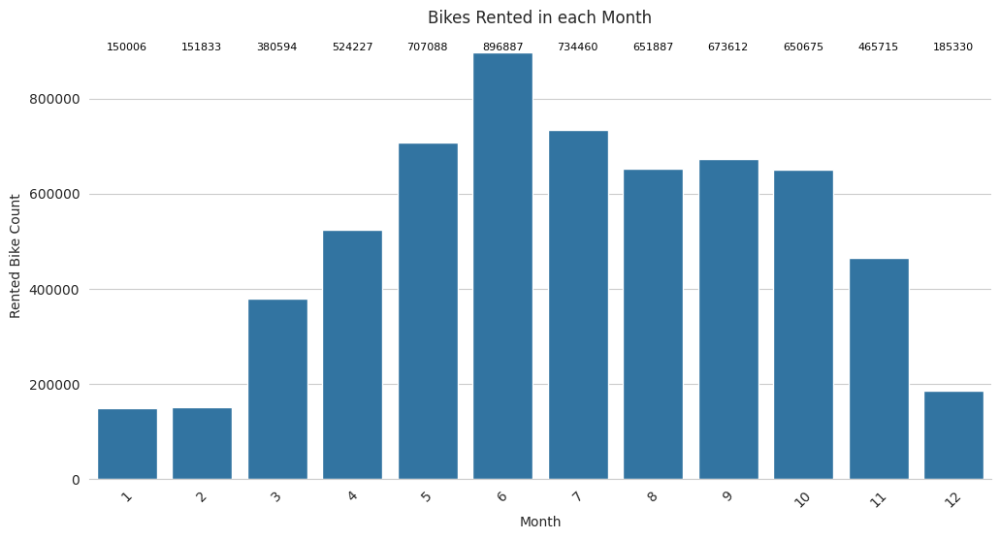

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd # make sure pandas is imported

# Assuming df is your original DataFrame
# Ensure Date is in datetime format
df['Date'] = pd.to_datetime(df['Date'])

# Extract month and perform groupby with sum
df['month'] = df['Date'].dt.month
df_by_month = df.groupby(['month'])['Rented Bike Count'].sum().reset_index()

# Now proceed with plotting
fig = plt.figure(figsize=(12, 6))

sns.barplot(data=df_by_month, x='month', y='Rented Bike Count')

plt.title('Bikes Rented in each Month', fontsize=12)
plt.xticks(rotation=45)
plt.xlabel('Month')
plt.ylabel('Rented Bike Count')
sns.despine(left=True)

max_count = df_by_month['Rented Bike Count'].max()
text_y = max_count + 5000

for i in range(12):
    plt.text(
        x=i,
        y=text_y,
        s=df_by_month['Rented Bike Count'].iloc[i],
        color='black',
        fontsize=8,
        horizontalalignment='center',
    )

plt.show()

In [31]:
#creating list of numerical features
numeric_features = df.describe().columns


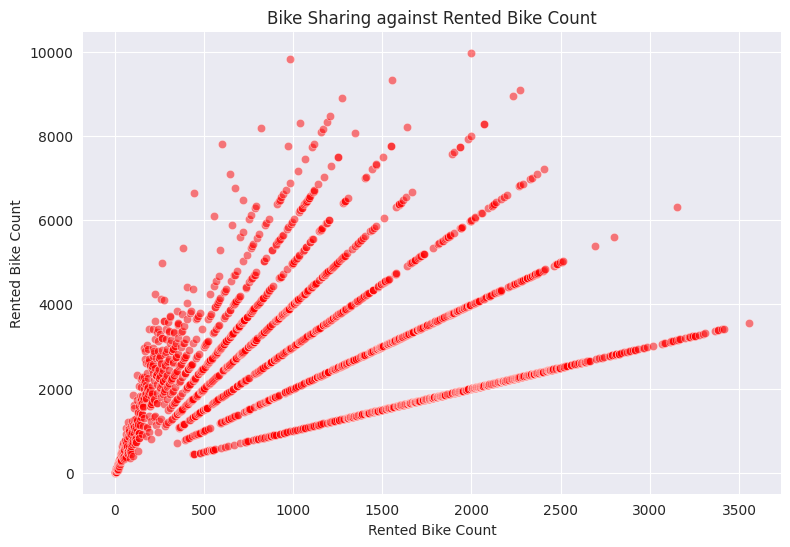

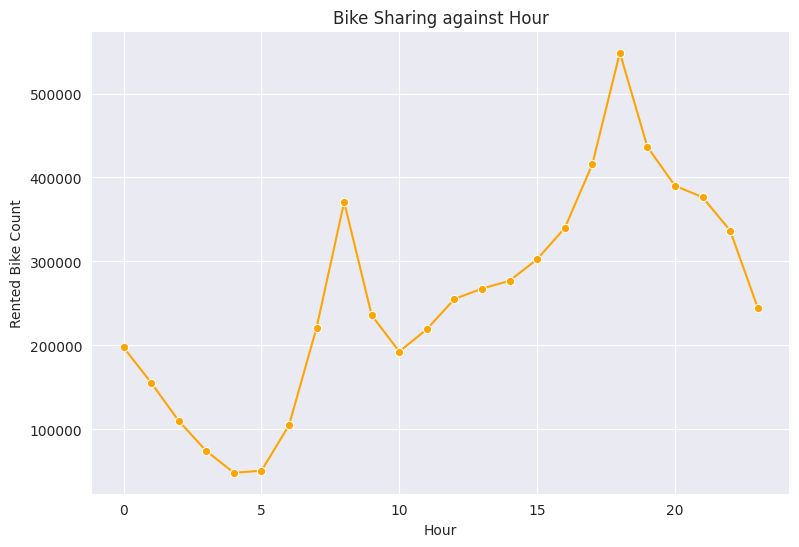

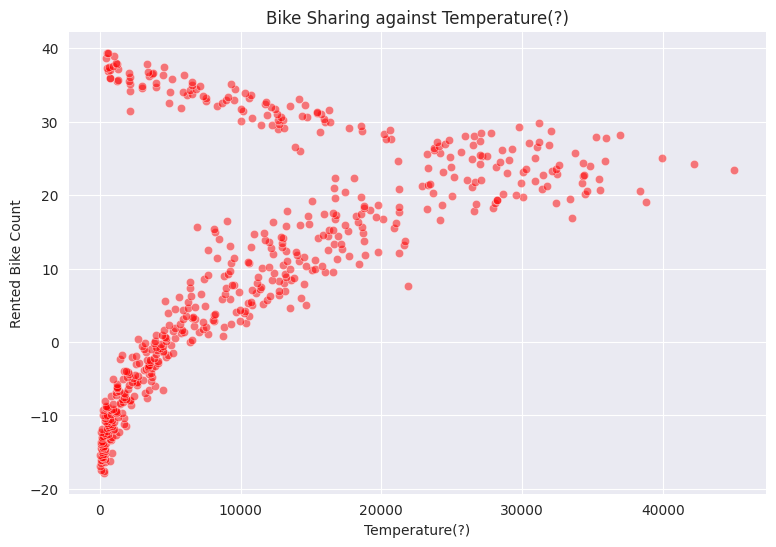

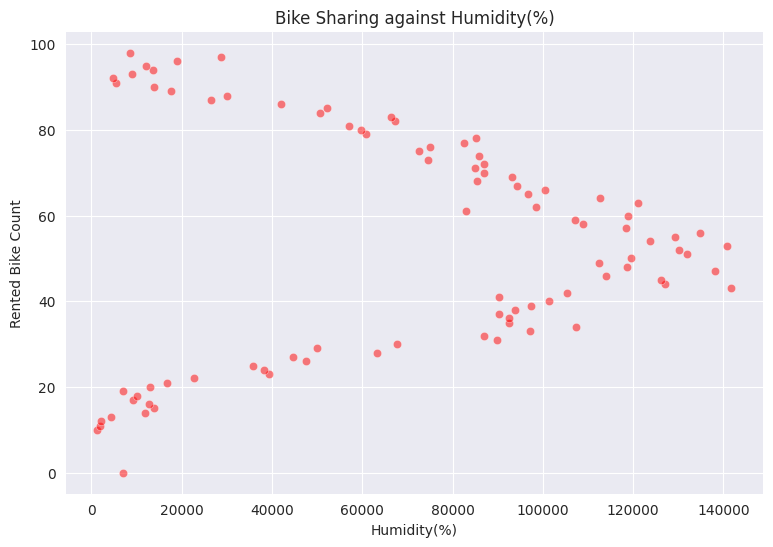

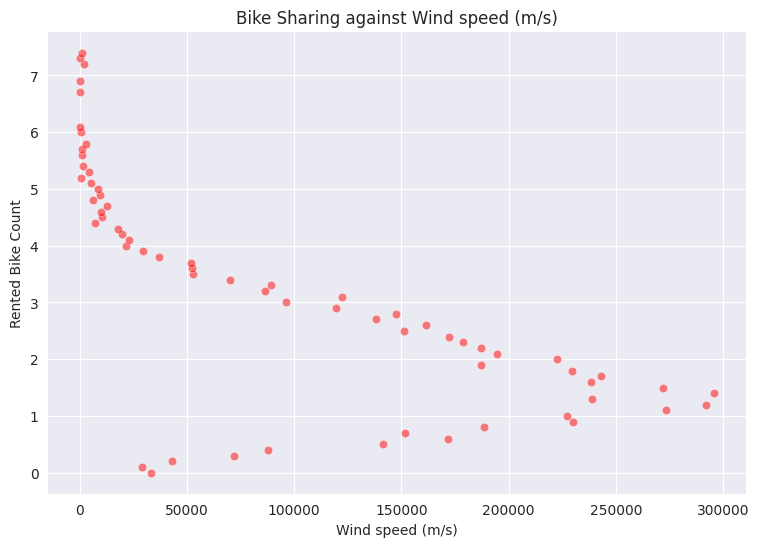

...

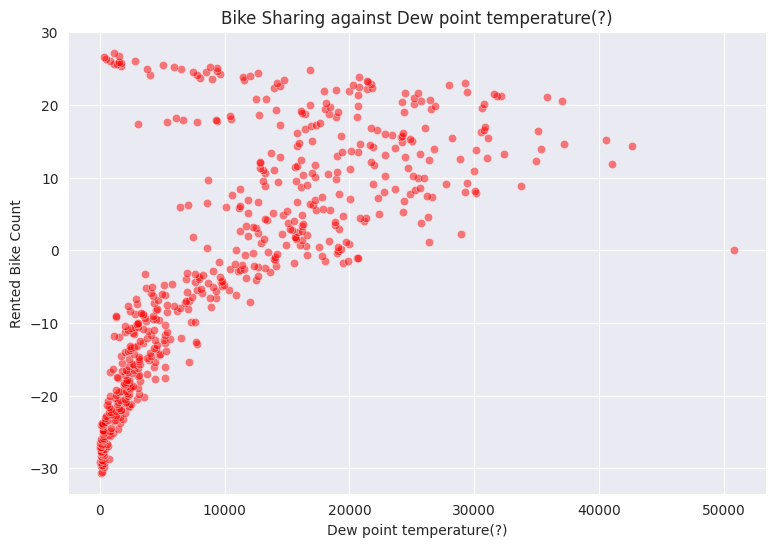

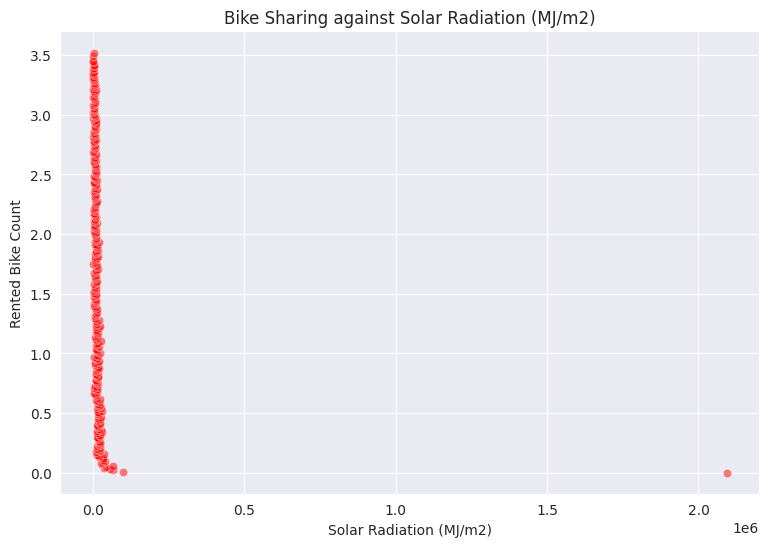

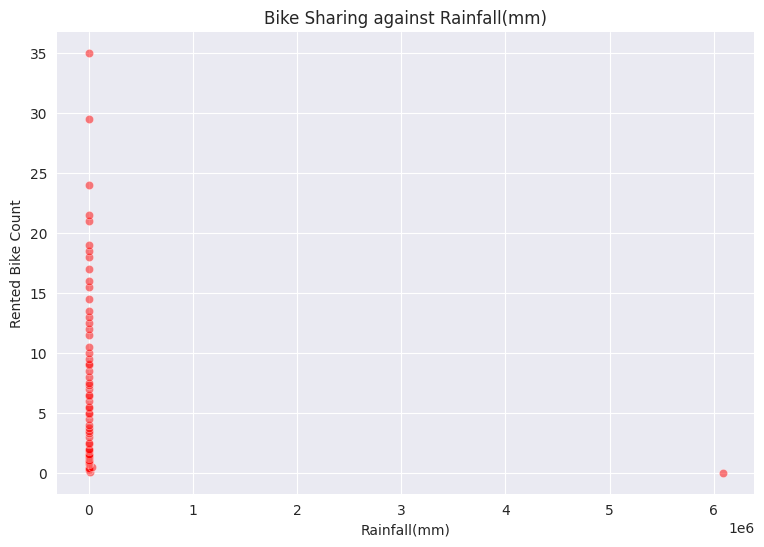

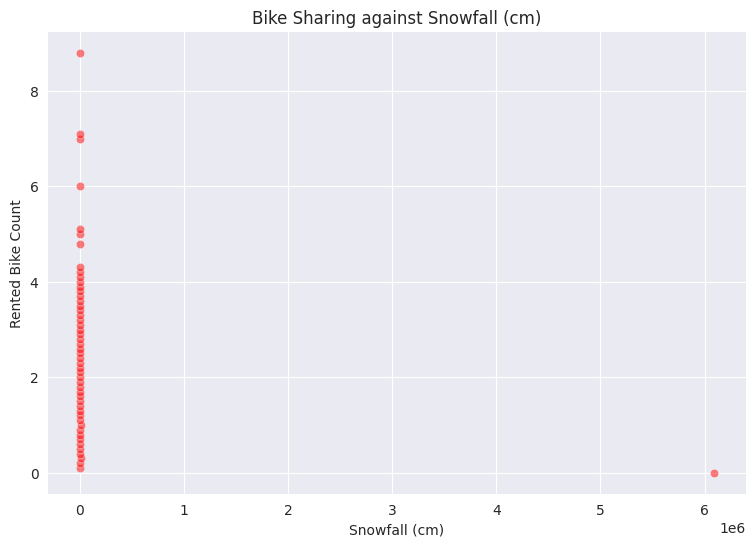

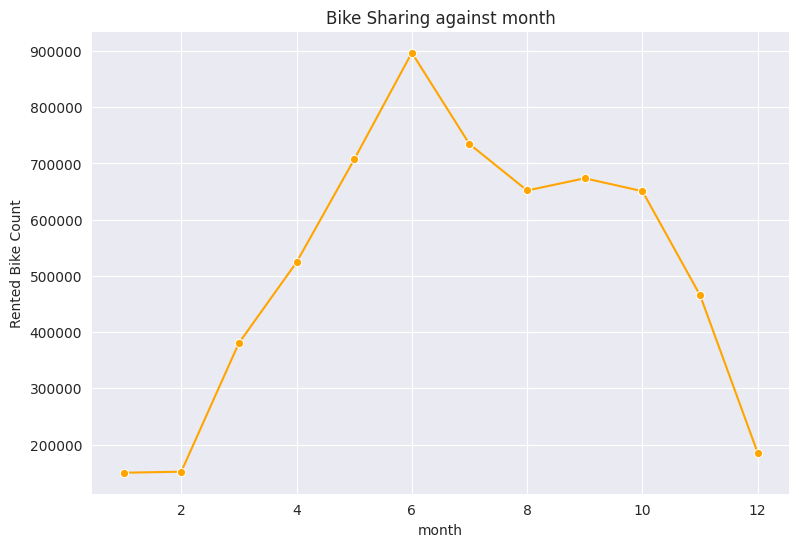

In [40]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd  # Assuming pandas is imported

# Assuming df is your DataFrame and numeric_features contains numerical columns
for i in numeric_features[1:]:  # Exclude the "Rented Bike Count" column

    sns.set_style('darkgrid')  # Set background style

    fig, ax = plt.subplots(figsize=(9, 6))  # Create figure and axis together

    # Group data, calculate sum (avoid creating duplicate columns)
    df_grouped = df.groupby(i)['Rented Bike Count'].sum()  # Group by single column

    if df_grouped.size < 25:  # Check the number of unique values
        sns.lineplot(data=df_grouped.to_frame().reset_index(),  # Convert to DataFrame for plotting
                     x=i, y='Rented Bike Count', color='orange', marker="o", ax=ax)
    else:
        # Convert series to DataFrame and rename the column if necessary
        df_temp = df_grouped.to_frame()
        if df_temp.index.name == df_temp.columns[0]:
            df_temp = df_temp.rename(columns={df_temp.columns[0]: 'value'}) # Rename the series to avoid duplicate column names
            df_temp = df_temp.reset_index()

        # Use i as the column name for the x-axis if i is "Rented Bike Count"
        sns.scatterplot(data=df_temp,
                        x= i if i == 'Rented Bike Count' else 'Rented Bike Count',
                        y= 'value' if i == 'Rented Bike Count' else i, # Use 'value' as the column name if i is "Rented Bike Count"
                        color='red', ax=ax, alpha=0.5)

    plt.xlabel(i)  # Set x-axis label to the current feature
    plt.ylabel('Rented Bike Count')
    ax.set_title(f'Bike Sharing against {i}')
    sns.despine(left=True, bottom=True)

plt.show()

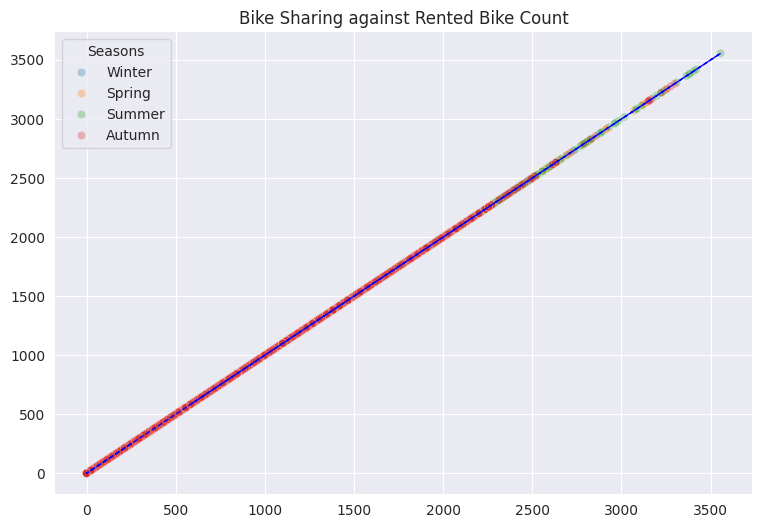

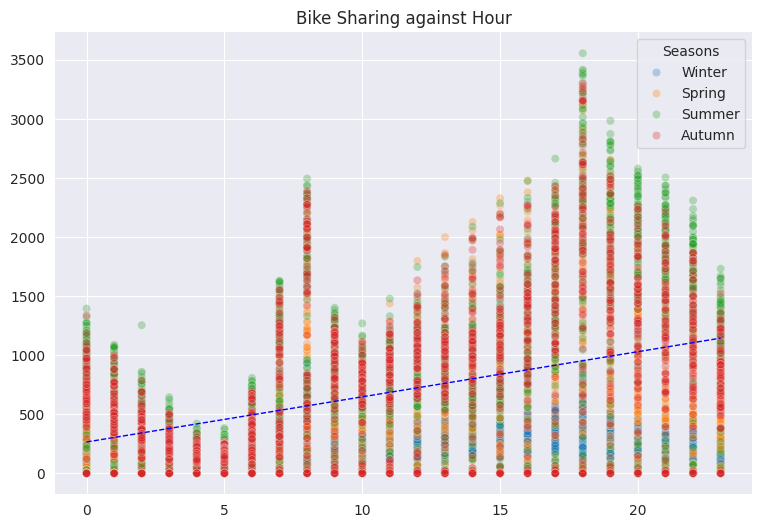

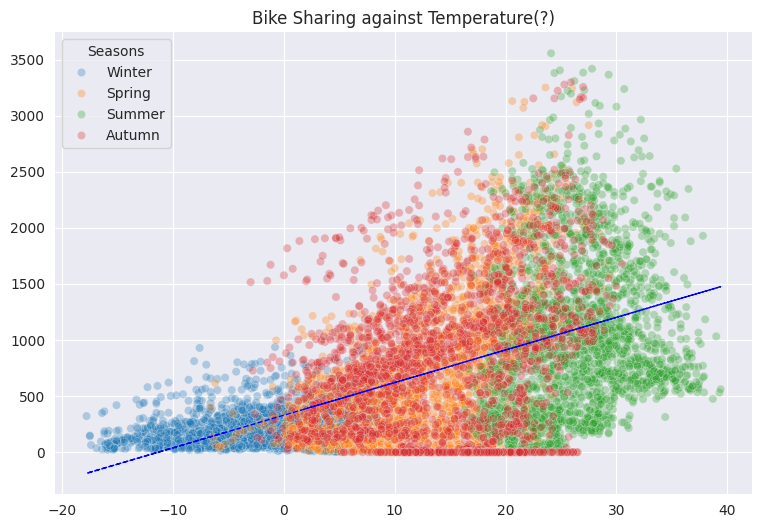

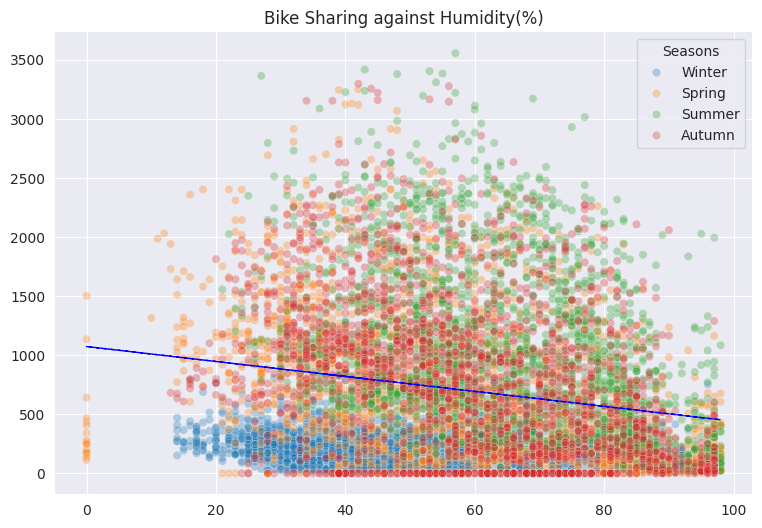

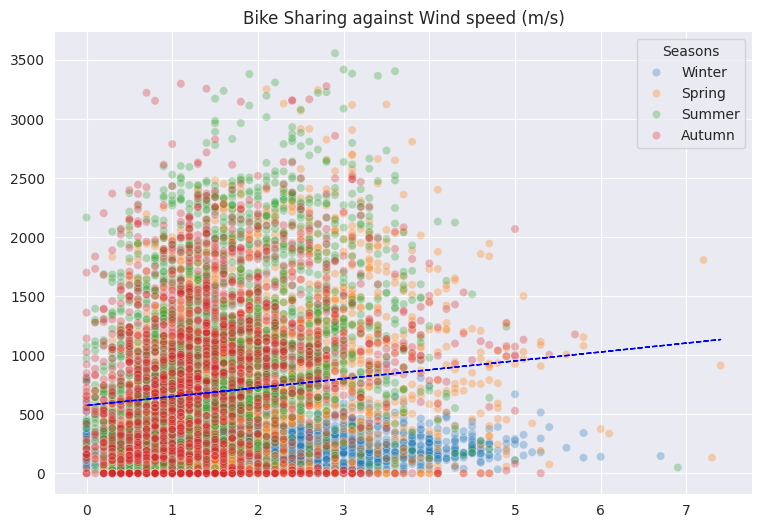

...

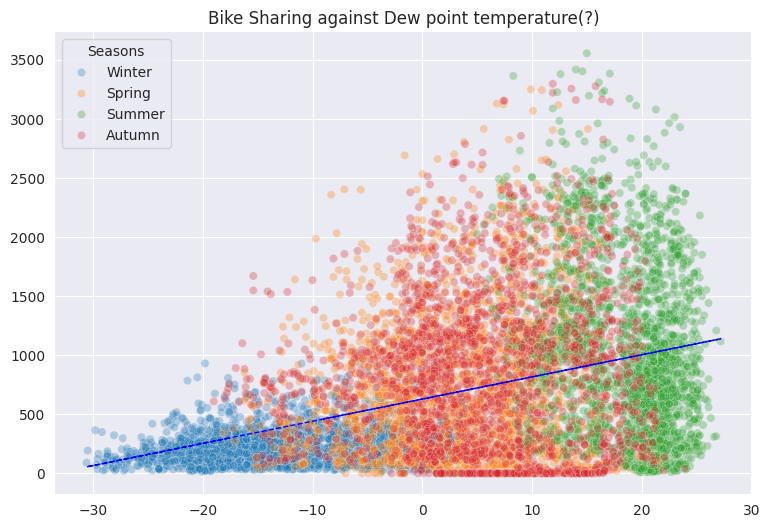

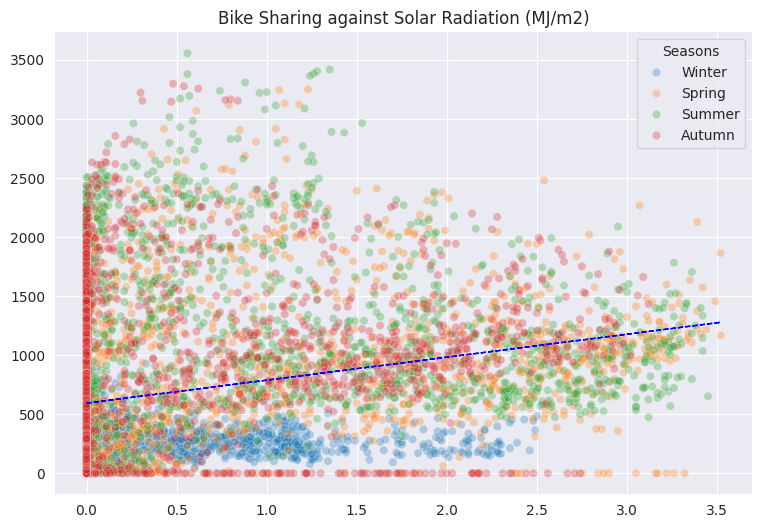

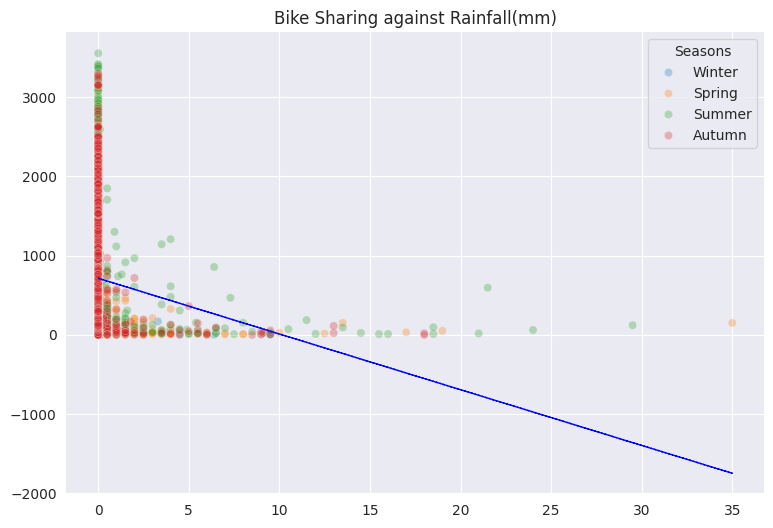

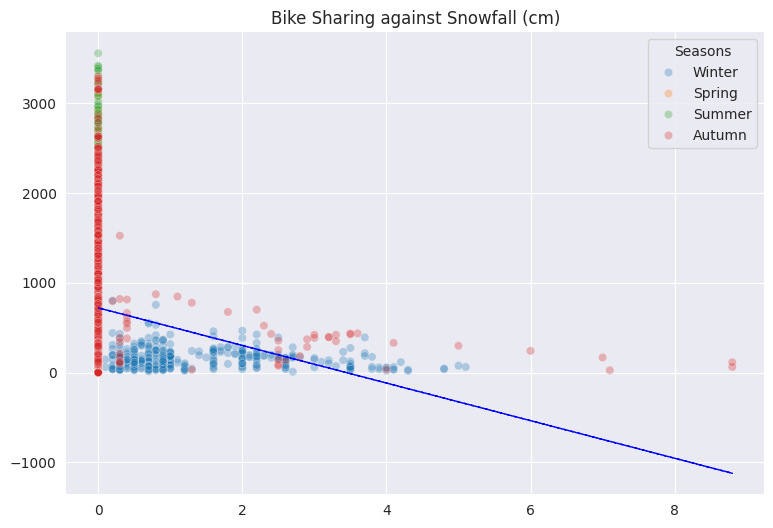

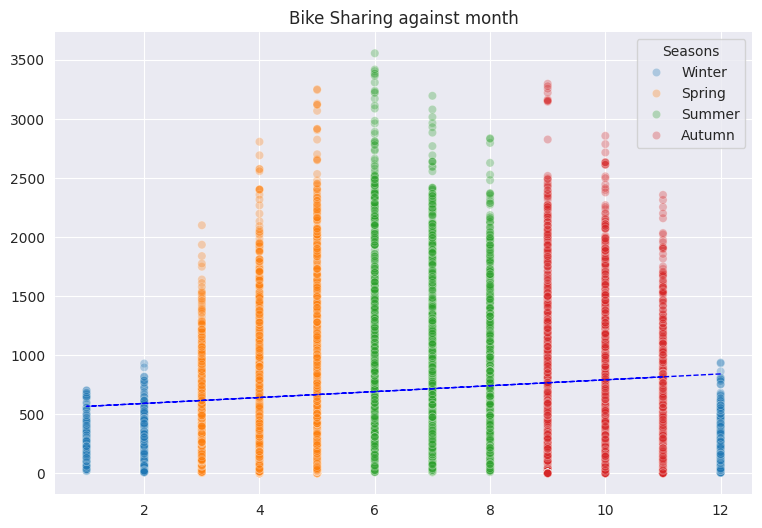

In [41]:
# Creating scatterplot to determine the co-relation
for i in (numeric_features[1:]):
  sns.set_style('darkgrid')
  fig = plt.figure(figsize = (9,6))
  ax = fig.gca()

  sns.scatterplot(data = df, x = i ,  y = 'Rented Bike Count' ,hue = 'Seasons', ax =ax, alpha = 0.3)  #... using Season as hue to see the distribution of count

  z = np.polyfit(df[i], df['Rented Bike Count'], 1)  # creating best fit line
  y_hat = np.poly1d(z)(df[i])
  plt.plot(df[i], y_hat, "b--", lw=1)

  plt.xlabel('')
  plt.ylabel('')
  ax.set_title(f'Bike Sharing against {i}')
  sns.despine(left = True, bottom =True)

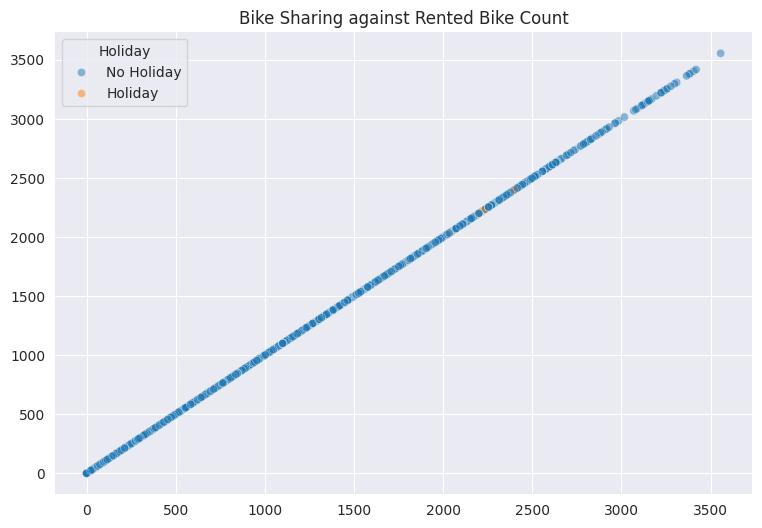

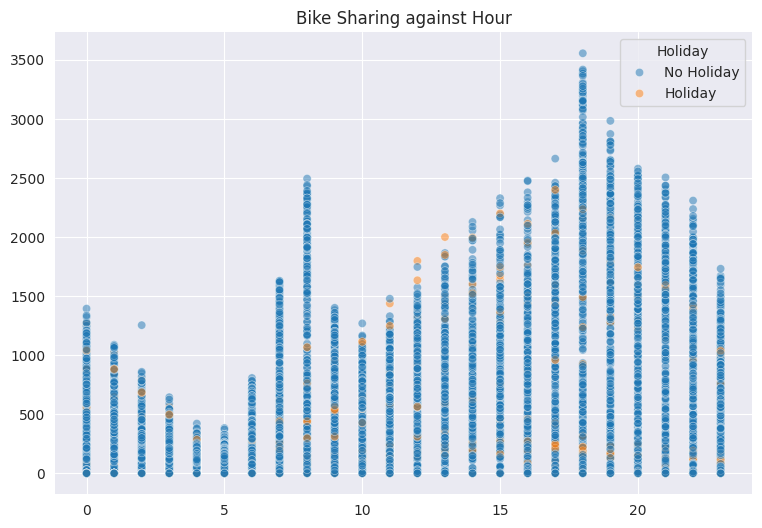

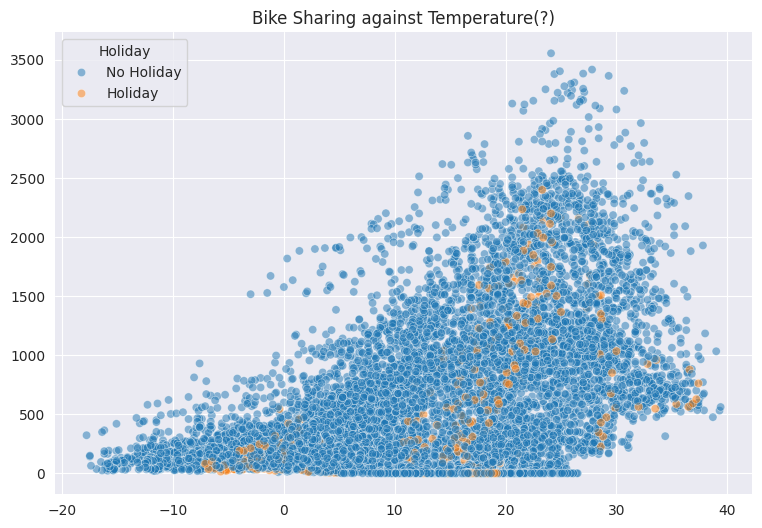

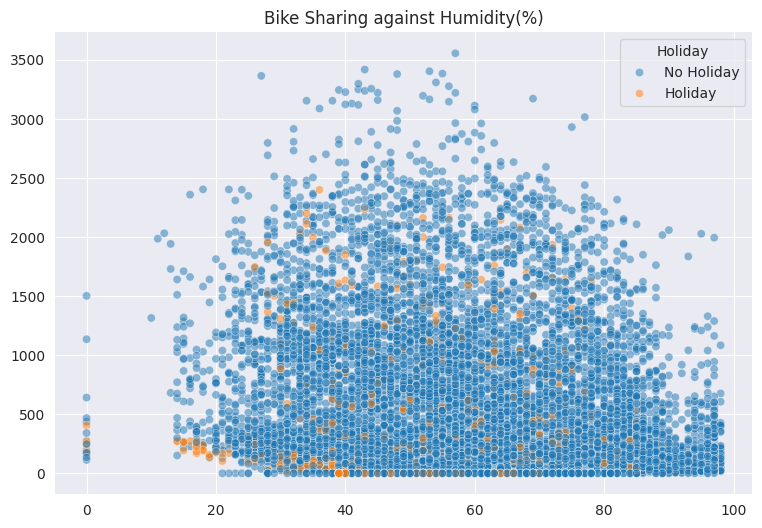

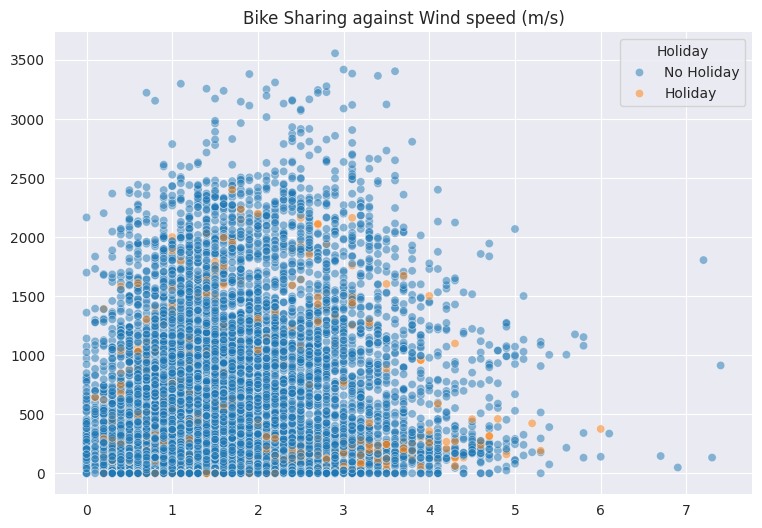

...

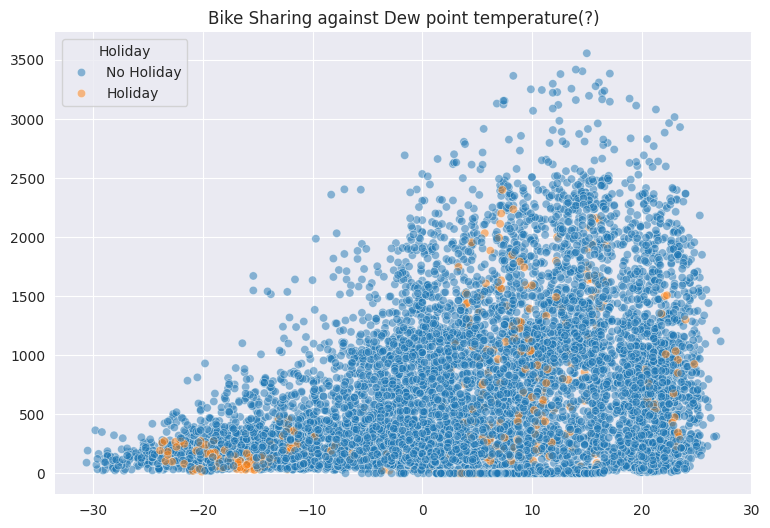

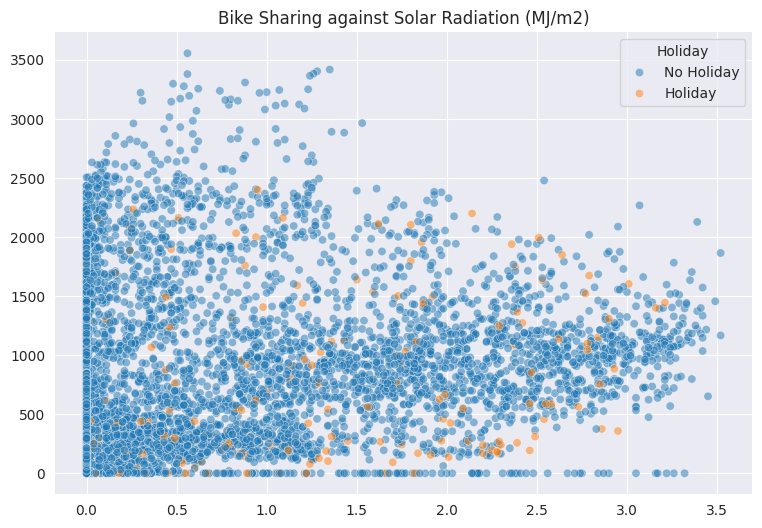

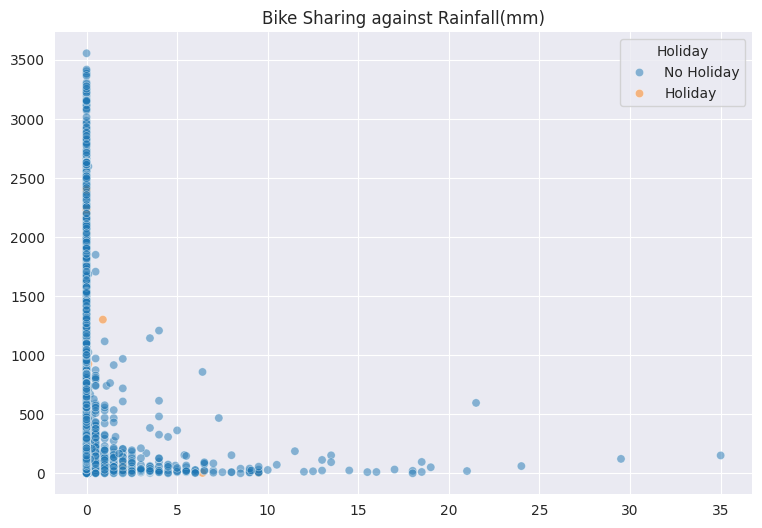

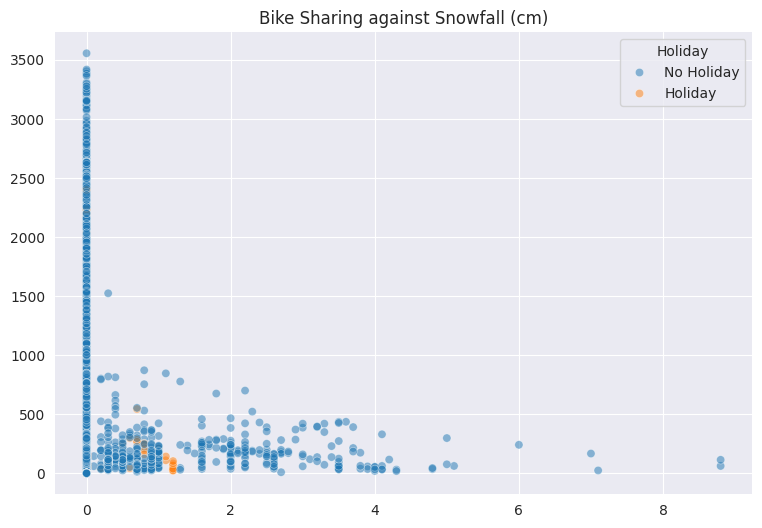

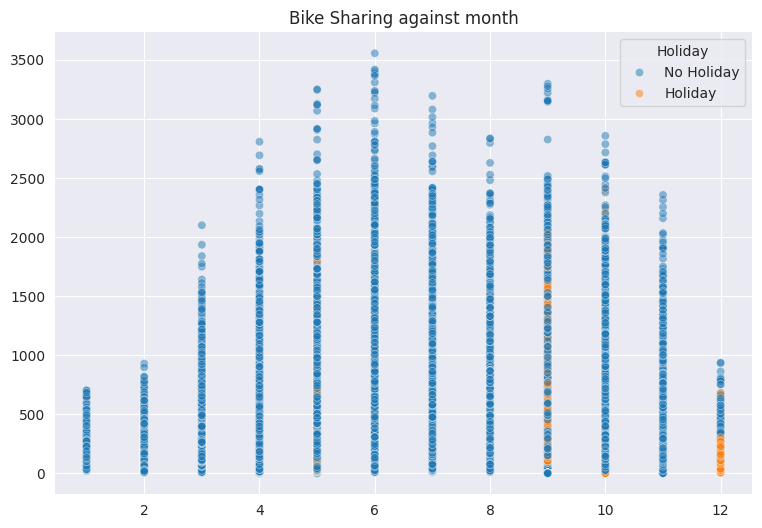

In [42]:
# Visualizing numerical variables again Holidays
for i in (numeric_features[1:]):
  sns.set_style('darkgrid')
  fig = plt.figure(figsize = (9,6))
  ax = fig.gca()
  sns.scatterplot(data = df, x = i ,  y = 'Rented Bike Count' ,hue = 'Holiday', ax =ax, alpha = 0.5)
  plt.xlabel('')
  plt.ylabel('')
  ax.set_title(f'Bike Sharing against {i}')
  sns.despine(left = True, bottom =True)

In [43]:
print(df.describe(include = ['object']).columns)
print(df.describe().columns)

Index(['Seasons', 'Holiday', 'Functioning Day', 'year', 'day'], dtype='object')
Index(['Date', 'Rented Bike Count', 'Hour', 'Temperature(?)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(?)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'month'],
      dtype='object')


In [44]:
# Creating variable to analayze the changes in diffrent climatic factors as per Season

climate = ['Hour','Temperature(°C)','Humidity(%)','Solar Radiation (MJ/m2)','Rainfall(mm)','Snowfall (cm)','Seasons']

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Load your dataset
df = pd.read_csv("SeoulBikeData.csv")

# Define categorical and numerical features
categorical_variables = ['Seasons', 'Holiday', 'Functioning Day','Date']
numeric_features = ['Rented Bike Count', 'Hour', 'Temperature(°C)', 'Humidity(%)', 'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(°C)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)']

# Visualization for categorical variables
for i in categorical_variables[1:]:
    # ... your code for visualizing against categorical variables
    print(i) # Added this line for testing. Remove this to add your visualization code.
# Visualization for numerical features
for i in numeric_features[1:]:
    # ... your code for visualizing against numerical features
    print (i) # Added this line for testing. Remove this to add your visualization code.

plt.show()

Holiday
Functioning Day
Date
Hour
Temperature(°C)
Humidity(%)
Wind speed (m/s)
Visibility (10m)
Dew point temperature(°C)
Solar Radiation (MJ/m2)
Rainfall(mm)
Snowfall (cm)


Index(['Rented Bike Count', 'Hour', 'Temperature(?)', 'Humidity(%)',
       'Wind speed (m/s)', 'Visibility (10m)', 'Dew point temperature(?)',
       'Solar Radiation (MJ/m2)', 'Rainfall(mm)', 'Snowfall (cm)', 'Holiday',
       'Functioning Day'],
      dtype='object')


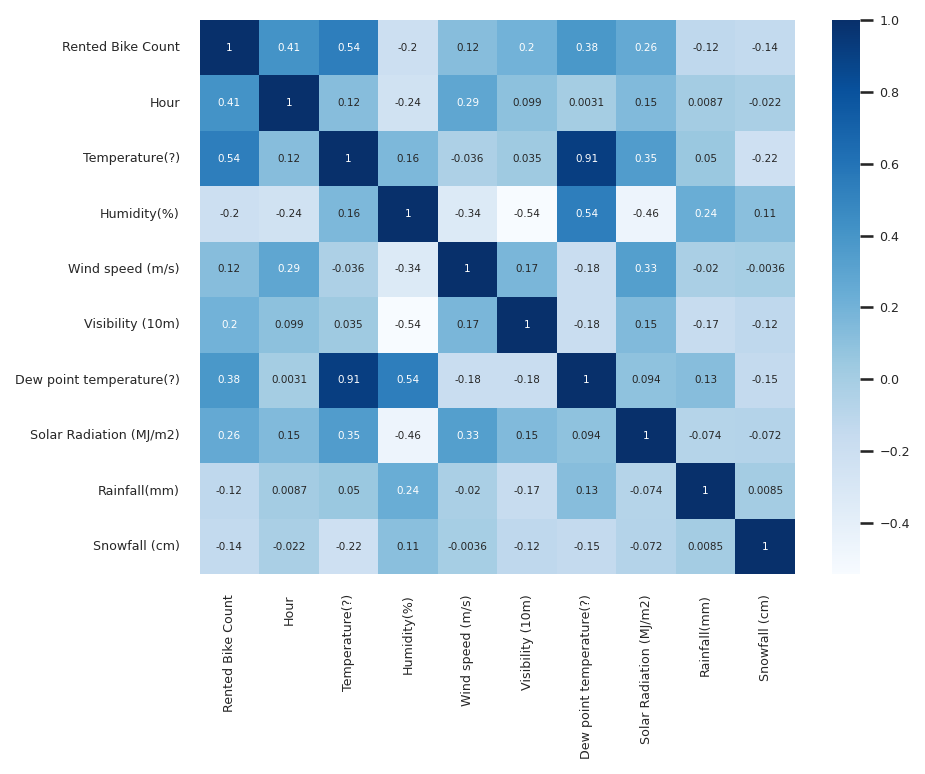

In [71]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming you have a DataFrame named 'df' containing your data

# Print column names for verification
print(df.columns)

# Handle missing values based on actual column names (adjust if needed)
df.dropna(subset=['Temperature(?)', 'Dew point temperature(?)'], inplace=True)

# Convert 'Date' to datetime (if not already done or not applicable)
# df['Date'] = pd.to_datetime(df['Date'])  # Optional, uncomment if needed

# Check if "Date" column exists before trying to drop it
if 'Date' in df.columns:
    df = df.drop('Date', axis=1)

# Check if 'Seasons' column exists before dropping (adjust the name if needed)
if 'Seasons' in df.columns:
    df = df.drop('Seasons', axis=1)

# Select only numeric columns for correlation analysis
numeric_df = df.select_dtypes(include=['number'])

plt.rcParams['figure.dpi'] = 150
sns.set(font_scale=0.55)

# Create the heatmap using only numeric data
sns.heatmap(numeric_df.corr(), annot=True, cmap='Blues', annot_kws={'size': 5})

plt.show()

In [72]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# defining function to get the VIF of dataframe
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [75]:
# Check if 'Date' column exists and create 'month', 'year', and 'day' columns if needed
if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])  # Convert to datetime if not already
    df['month'] = df['Date'].dt.month
    df['year'] = df['Date'].dt.year
    df['day'] = df['Date'].dt.day

    # Now you can convert the new columns to numeric type
    df['month'] = pd.to_numeric(df['month'])
    df['year'] = pd.to_numeric(df['year'])
    df['day'] = pd.to_numeric(df['day'])

# Remove the 'Date' column if it exists. This should be done after creating the new columns
if 'Date' in df.columns:
    df = df.drop('Date', axis=1)

calc_vif(df[[i for i in df.describe().columns if i not in ['Rented Bike Count']]])

,variables,VIF
0,Hour,4.418242
1,Temperature(?),33.385256
2,Humidity(%),5.371996
3,Wind speed (m/s),4.805364
4,Visibility (10m),9.085977
5,Dew point temperature(?),17.126199
6,Solar Radiation (MJ/m2),2.881590
7,Rainfall(mm),1.081567
8,Snowfall (cm),1.120833


from matplotlib import pyplot as plt
_df_0['VIF'].plot(kind='hist', bins=20, title='VIF')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['VIF'].plot(kind='line', figsize=(8, 4), title='VIF')
plt.gca().spines[['top', 'right']].set_visible(False)

In [76]:
calc_vif(df[[i for i in df.describe().columns if i not in ['Rented Bike Count','year']]])  # ... dropping year colum from Dataset

,variables,VIF
0,Hour,4.418242
1,Temperature(?),33.385256
2,Humidity(%),5.371996
3,Wind speed (m/s),4.805364
4,Visibility (10m),9.085977
5,Dew point temperature(?),17.126199
6,Solar Radiation (MJ/m2),2.881590
7,Rainfall(mm),1.081567
8,Snowfall (cm),1.120833


from matplotlib import pyplot as plt
_df_2['VIF'].plot(kind='hist', bins=20, title='VIF')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_3['VIF'].plot(kind='line', figsize=(8, 4), title='VIF')
plt.gca().spines[['top', 'right']].set_visible(False)

<Axes: xlabel='Rented Bike Count'>

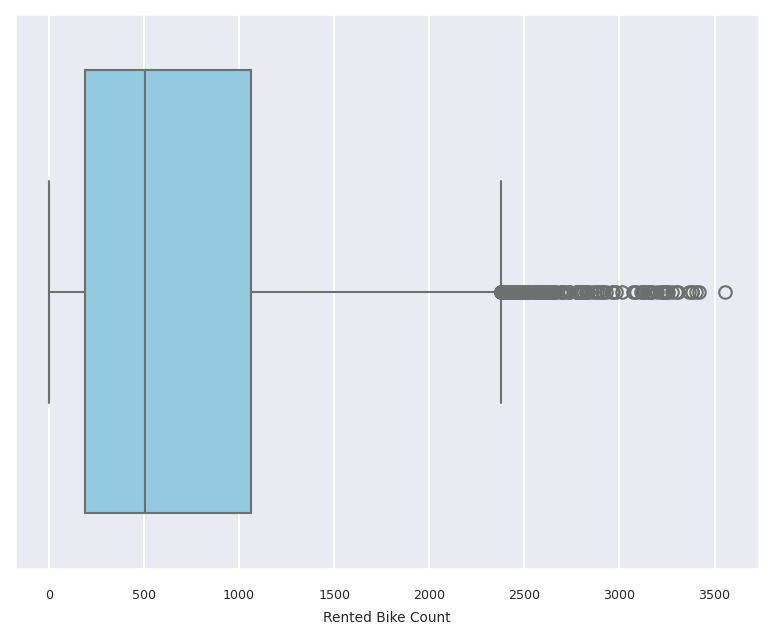

In [77]:
# Checking for outliers in the dataset
sns.boxplot(data = df, x ='Rented Bike Count',color='skyblue')

In [80]:
# Defining the interquartile range for Dataset
Q1 = df.quantile(0.25, numeric_only=True)  # Add numeric_only=True to consider only numerical columns
Q3 = df.quantile(0.75, numeric_only=True)
IQR = Q3 - Q1

In [81]:
# writing a outlier function for removing outliers!
def outlier_treatment(datacolumn):
 sorted(datacolumn)
 Q1,Q3 = np.percentile(datacolumn , [25,75])
 IQR = Q3 - Q1
 lower_range = Q1 - (1.5 * IQR)
 upper_range = Q3 + (1.5 * IQR)

 return lower_range,upper_range

In [82]:
lower_bound,upper_bound = outlier_treatment(df['Rented Bike Count'])

<Axes: xlabel='Rented Bike Count'>

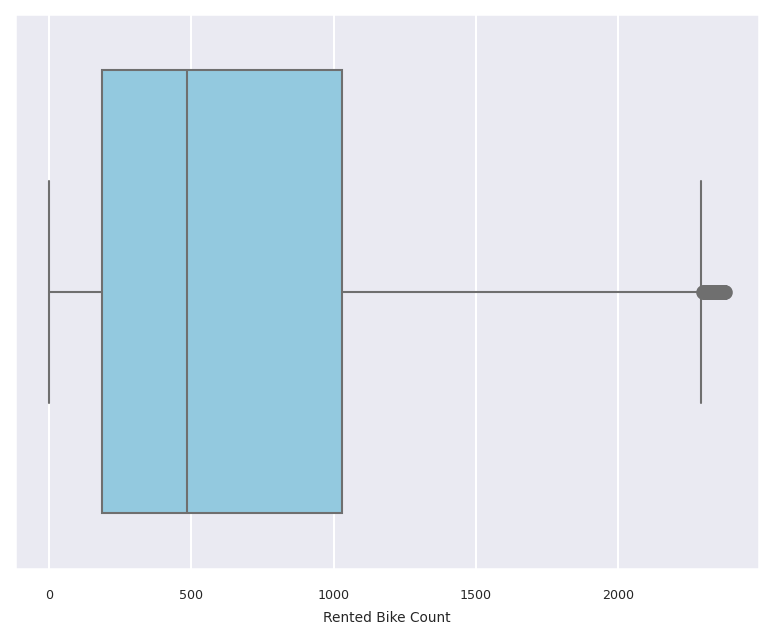

In [83]:
# Removing outliers from the data
df_subset = df[(df['Rented Bike Count']>lower_bound) & (df['Rented Bike Count'] <upper_bound)]
sns.boxplot(data = df_subset, x = 'Rented Bike Count',color='skyblue')


In [86]:
df.head()
x = df_subset.drop(['Rented Bike Count'],axis =1) # .. droping the Dependent variable
y =  df_subset['Rented Bike Count']

In [87]:
#Checking the independent variable dataset
x

,Hour,Temperature(?),Humidity(%),Wind speed (m/s),Visibility (10m),Dew point temperature(?),Solar Radiation (MJ/m2),Rainfall(mm),Snowfall (cm),Holiday,Functioning Day
0,0,-5.2,37,2.2,2000,-17.6,0.0,0.0,0.0,No Holiday,Yes
1,1,-5.5,38,0.8,2000,-17.6,0.0,0.0,0.0,No Holiday,Yes
2,2,-6.0,39,1.0,2000,-17.7,0.0,0.0,0.0,No Holiday,Yes
3,3,-6.2,40,0.9,2000,-17.6,0.0,0.0,0.0,No Holiday,Yes
4,4,-6.0,36,2.3,2000,-18.6,0.0,0.0,0.0,No Holiday,Yes
...,...,...,...,...,...,...,...,...,...,...,...
8755,19,4.2,34,2.6,1894,-10.3,0.0,0.0,0.0,No Holiday,Yes
8756,20,3.4,37,2.3,2000,-9.9,0.0,0.0,0.0,No Holiday,Yes
8757,21,2.6,39,0.3,1968,-9.9,0.0,0.0,0.0,No Holiday,Yes
8758,22,2.1,41,1.0,1859,-9.8,0.0,0.0,0.0,No Holiday,Yes


In [94]:
# Assuming 'Seasons' is not present in 'x'
x = pd.get_dummies(x, columns=['Holiday', 'Functioning Day'])

In [95]:
numeric_variables = x.describe().columns.to_list()   # .. defining the numeric variables

In [ ]:
# Applying zscore to normalize the data
from scipy.stats import zscore
x = x.apply(zscore)

In [96]:
# Spliting dataset into train and test
x_train,x_test,y_train,y_test =  train_test_split(x, y, test_size = 0.2, random_state= 1)

In [97]:
# fitting the linear regression for train set
reg = LinearRegression().fit(x_train,y_train)

In [98]:
reg.score(x_train,y_train)

0.5293323991232142

In [99]:
# calculating predicted variable using best fit regression line
y_pred = reg.predict(x_test)
y_pred_train  = reg.predict(x_train)

In [100]:
# Caluculating Metrics of ML model
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

MSE_test  = mean_squared_error((y_test), (y_pred))
MSE_train  = mean_squared_error((y_train), (y_pred_train))
print("MSE_test :" , MSE_test)
print("MSE_train :" , MSE_train)

MAE_test= mean_absolute_error((y_test),(y_pred))
MAE_train  = mean_absolute_error((y_train), (y_pred_train))
print("MAE_test :" ,MAE_test)
print("MAE_train :" ,MAE_train)

RMSE_test = np.sqrt(MSE_test)
RMSE_train = np.sqrt(MSE_train)
print("RMSE_test :" ,RMSE_test)
print("RMSE_train :" ,RMSE_train)

MSE_test : 167334.31995537525
MSE_train : 163720.31871384947
MAE_test : 310.85778506413106
MAE_train : 306.28590014699193
RMSE_test : 409.0651781261456
RMSE_train : 404.6236754242755


In [101]:

# Calulating the R-Square and Adjusted R-square
r2_test = r2_score((y_test), (y_pred))
r2_train = r2_score((y_train), (y_pred_train))
print("R2_test :" ,r2_test)
print("R2_train :" ,r2_train)
print("Adjusted R2_test : ",1-(1-r2_score((y_test), (y_pred)))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)))
print("Adjusted R2_train : ",1-(1-r2_score((y_train), (y_pred_train)))*((x_train.shape[0]-1)/(x_train.shape[0]-x_train.shape[1]-1)))

R2_test : 0.5166150744825853
R2_train : 0.5293323991232142
Adjusted R2_test :  0.5129337598770045
Adjusted R2_train :  0.5284413726471113


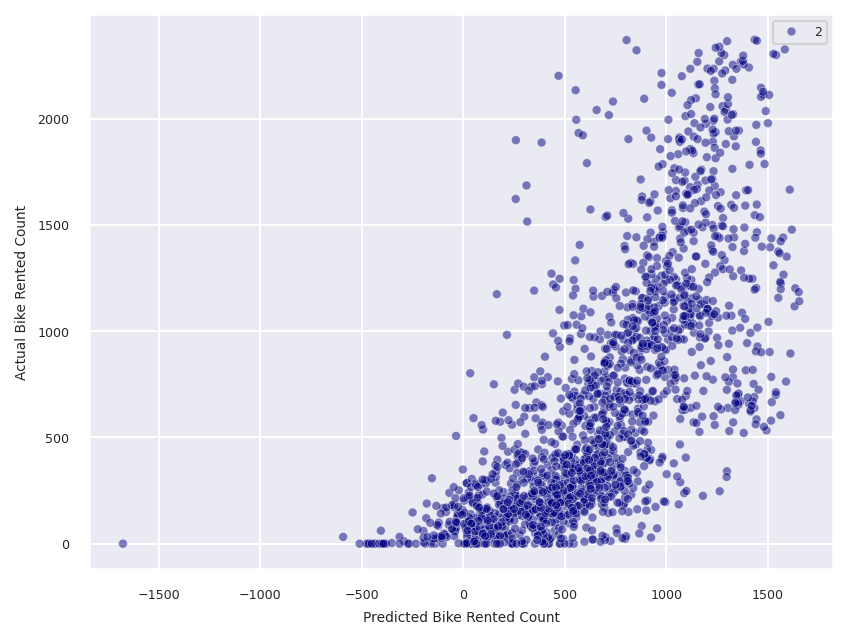

In [103]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming y_pred and y_test are Series or arrays
df_results = pd.DataFrame({'Predicted Bike Rented Count': y_pred, 'Actual Bike Rented Count': y_test})

# Create the scatter plot
sns.scatterplot(data=df_results, x='Predicted Bike Rented Count', y='Actual Bike Rented Count', size=2, alpha=0.5, color="navy")

plt.ylabel('Actual Bike Rented Count')
plt.xlabel('Predicted Bike Rented Count')
plt.show()

<ipython-input-104-cbb6cbd117be>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(((y_test)- (y_pred)),bins=20,color = "coral")


Text(0.5, 0.98, 'Residual Analysis')

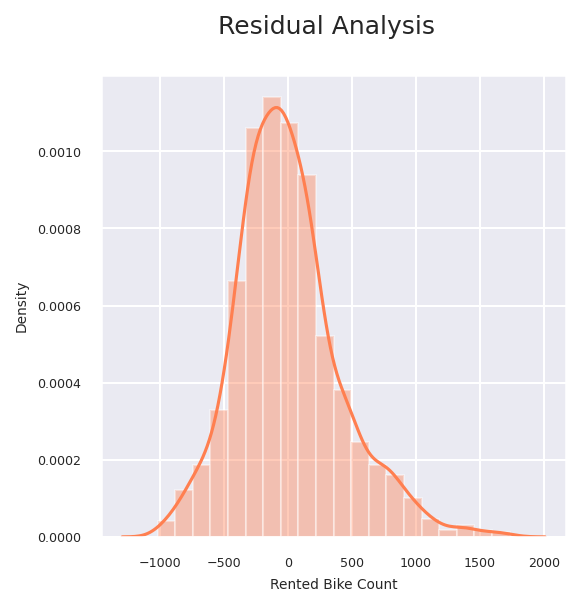

In [104]:
# Visualizing the residual values distribution
fig=plt.figure(figsize=(4,4))

sns.distplot(((y_test)- (y_pred)),bins=20,color = "coral")

#Plot Label
fig.suptitle('Residual Analysis', fontsize = 12)

In [105]:
# Applying lasso Regerssion
from sklearn.linear_model import Lasso
lasso  = Lasso(alpha=0.005 , max_iter= 10000)

lasso.fit(x_train, y_train)


Lasso(alpha=0.005, max_iter=10000)

In [106]:
lasso.score(x_train, y_train)

0.5293323949204529

In [107]:
y_pred_l = lasso.predict(x_test)
y_pred_l_train = lasso.predict(x_train)

In [108]:
#Evaluation Metrics
MSE_l_test  = mean_squared_error((y_test), (y_pred_l))
MSE_l_train  = mean_squared_error((y_train), (y_pred_l_train))

print("MSE_test :" , MSE_l_test)
print("MSE_train :" , MSE_l_train)

MAE_l_test = mean_absolute_error((y_test), (y_pred_l))
MAE_l_train = mean_absolute_error((y_train), (y_pred_l_train))
print("MAE_test :" ,MAE_l_test)
print("MAE_train :" ,MAE_l_train)

RMSE_l = np.sqrt(MSE_l_test)
RMSE_l_train = np.sqrt(MSE_l_train)
print("RMSE :" ,RMSE_l)
print("RMSE_train :" ,RMSE_l_train)

r2_l = r2_score((y_test), (y_pred_l))
r2_l_train = r2_score((y_train), (y_pred_l_train))
print("R2 :" ,r2_l)
print("R2_train :" ,r2_l_train)

print("Adjusted R2 : ",1-(1-r2_score((y_test), (y_pred_l)))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)))
print("Adjusted R2_train : ",1-(1-r2_score((y_train), (y_pred_l_train)))*((x_train.shape[0]-1)/(x_train.shape[0]-x_train.shape[1]-1)))

MSE_test : 167333.40524324117
MSE_train : 163720.32017576738
MAE_test : 310.8575066413641
MAE_train : 306.2855917278381
RMSE : 409.06406007279736
RMSE_train : 404.62367723079103
R2 : 0.5166177168458309
R2_train : 0.5293323949204529
Adjusted R2 :  0.5129364223636961
Adjusted R2_train :  0.5284413684363938


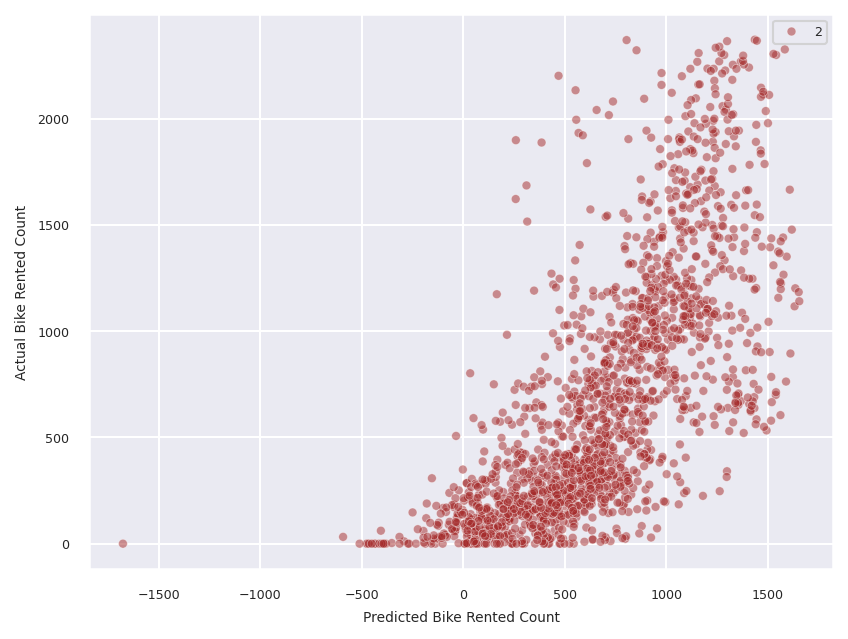

In [110]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming y_pred_l and y_test are Series or arrays
df_results = pd.DataFrame({'Predicted Bike Rented Count': y_pred_l, 'Actual Bike Rented Count': y_test})

# Create the scatter plot
sns.scatterplot(data=df_results, x='Predicted Bike Rented Count', y='Actual Bike Rented Count', size=2, alpha=0.5, color="brown")

plt.ylabel('Actual Bike Rented Count')
plt.xlabel('Predicted Bike Rented Count')
plt.show()

<ipython-input-111-2f4db9938931>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(((y_test)- (y_pred_l)),bins=20,color='r')


Text(0.5, 0.98, 'Residual Analysis')

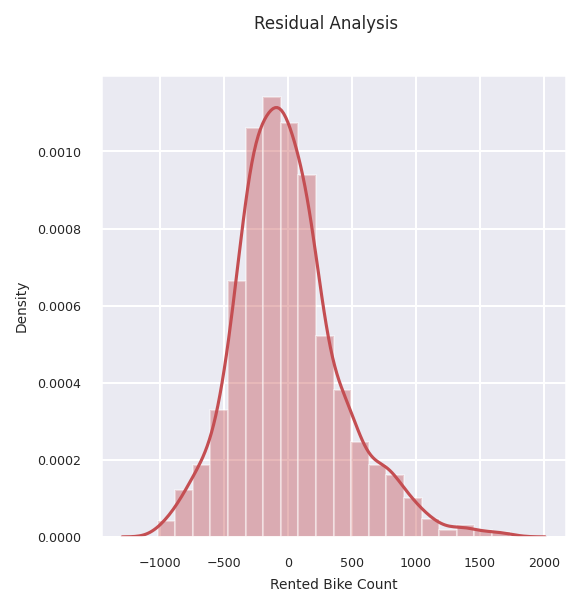

In [111]:
# Residual plot for Lasso Regression
fig=plt.figure(figsize=(4,4))

sns.distplot(((y_test)- (y_pred_l)),bins=20,color='r')

#Plot Label
fig.suptitle('Residual Analysis', fontsize = 8)

In [112]:
from sklearn.model_selection import GridSearchCV

In [114]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV

# Assuming you have your training data (x_train, y_train) prepared

# Define the Lasso model without the 'normalize' argument (deprecated)
lasso = Lasso(tol=1e-2)  # Set tolerance level

# Define the hyperparameter grid
parameters = {'alpha': [1e-15, 1e-13, 1e-10, 1e-8, 1e-5, 1e-4, 1e-3, 1e-2, 1e-1, 1, 5, 10, 20, 30, 40, 45, 50, 55, 60, 100]}

# Create the GridSearchCV object
lasso_regressor = GridSearchCV(lasso, parameters, scoring='neg_mean_squared_error', cv=5)

# Fit the model to the training data
lasso_regressor.fit(x_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.482e+08, tolerance: 1.901e+07
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.445e+08, tolerance: 1.897e+07
  model = cd_fast.enet_coordinate_descent(
/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.532e+08, tolerance: 1.927e

GridSearchCV(cv=5, estimator=Lasso(tol=0.01),
             param_grid={'alpha': [1e-15, 1e-13, 1e-10, 1e-08, 1e-05, 0.0001,
                                   0.001, 0.01, 0.1, 1, 5, 10, 20, 30, 40, 45,
                                   50, 55, 60, 100]},
             scoring='neg_mean_squared_error')

In [115]:
y_pred_lasso = lasso_regressor.predict(x_test)
y_pred_lasso_train = lasso_regressor.predict(x_train)

In [116]:
# Calculating Metrics for Grid Search CV on Lasso

MSE  = mean_squared_error((y_test), (y_pred_lasso))
MSE_train  = mean_squared_error((y_train), (y_pred_lasso_train))
print("MSE :" , MSE)
print("MSE_train :" , MSE_train)

MAE = mean_absolute_error((y_test), (y_pred_lasso))
MAE_train = mean_absolute_error((y_train), (y_pred_lasso_train))
print("MAE :" ,MAE)
print("MAE_train :" ,MAE_train)

RMSE = np.sqrt(MSE)
RMSE_train = np.sqrt(MSE_train)
print("RMSE :" ,RMSE)
print("RMSE_train :" ,RMSE_train)

r2 = r2_score((y_test), (y_pred_lasso))
r2_train = r2_score((y_train), (y_pred_lasso_train))
print("R2 :" ,r2)
print("R2_train :" ,r2_train)
print("Adjusted R2 : ",1-(1-r2_score((y_test), (y_pred_lasso)))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)))
print("Adjusted R2_train : ",1-(1-r2_score((y_train), (y_pred_lasso_train)))*((x_train.shape[0]-1)/(x_train.shape[0]-x_train.shape[1]-1)))

MSE : 167189.02529851432
MSE_train : 163778.53130958922
MAE : 310.788058856545
MAE_train : 306.303756395942
RMSE : 408.88754603009653
RMSE_train : 404.6956032743489
R2 : 0.5170347926067783
R2_train : 0.5291650479783295
Adjusted R2 :  0.5133566744485405
Adjusted R2_train :  0.5282737046877686


Text(0, 0.5, 'Predicted Count of Rented Bikes')

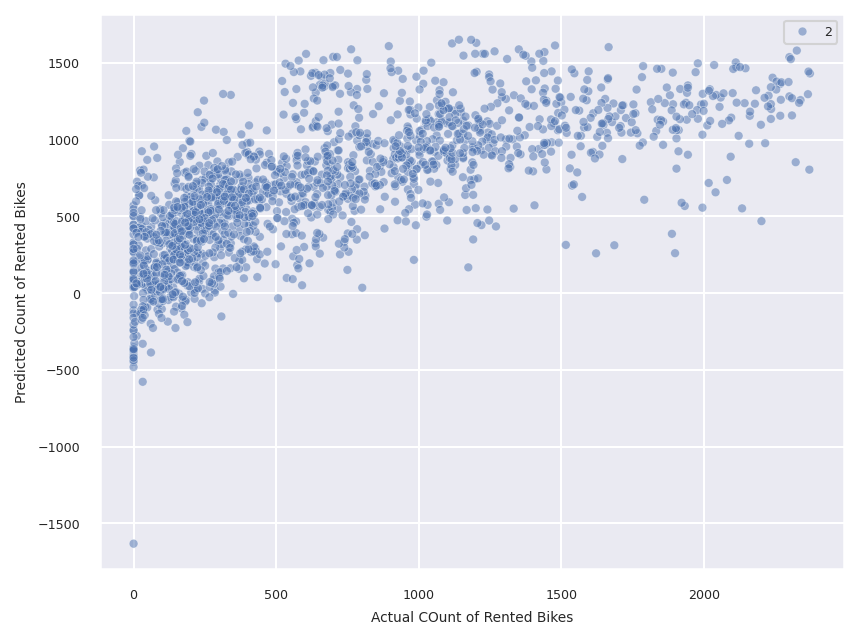

In [118]:
# Predicted vs Acutal for Grid Search CV
sns.scatterplot(x=(y_test), y=(y_pred_lasso),size = 2, alpha = 0.5) # Changed to use keyword arguments x and y for the data
plt.xlabel('Actual COunt of Rented Bikes')
plt.ylabel('Predicted Count of Rented Bikes')

<ipython-input-119-09f5d246f119>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(((y_test)- (y_pred_lasso)),bins=20,color='r')


Text(0.5, 0.98, 'Residual Analysis')

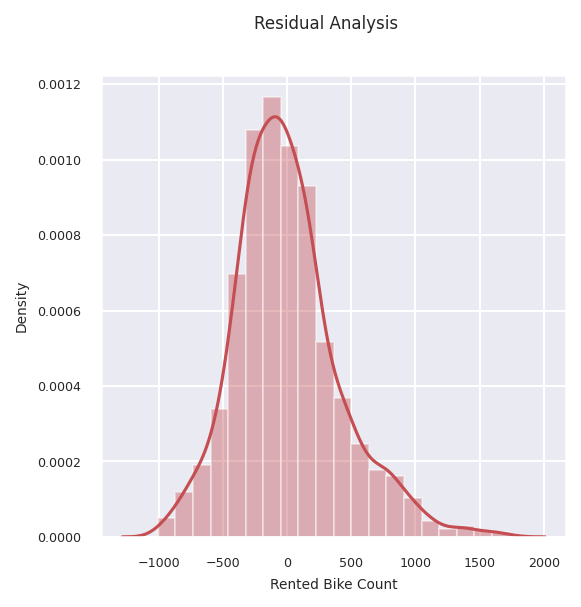

In [119]:
#Resildual Analysis
fig=plt.figure(figsize=(4,4))

sns.distplot(((y_test)- (y_pred_lasso)),bins=20,color='r')

#Plot Label
fig.suptitle('Residual Analysis', fontsize = 8)

In [120]:
from sklearn.tree import DecisionTreeRegressor
regeressor = DecisionTreeRegressor(random_state = 100)
regeressor.fit(x_train,y_train)

DecisionTreeRegressor(random_state=100)

In [121]:
y_predict = regeressor.predict(x_test)

In [122]:
# Metrics for Decision Tree
MSE_dt  = mean_squared_error((y_test), (y_predict))
print("MSE :" , MSE_dt)


MAE_dt= mean_absolute_error((y_test),(y_predict))
print("MAE :" ,MAE_dt)


RMSE_dt = np.sqrt(MSE_dt)
print("RMSE :" ,RMSE_dt)


MSE : 96183.92213829169
MAE : 187.0366066240558
RMSE : 310.13532874906673


In [123]:
# Accuracy of Decision Tree
r2_dt = r2_score((y_test), (y_predict))

print("R2 :" ,r2_dt)
print("Adjusted R2 : ",1-(1-r2_score((y_test), (y_predict)))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)))

R2 : 0.7221498969775599
Adjusted R2 :  0.7200338739316948


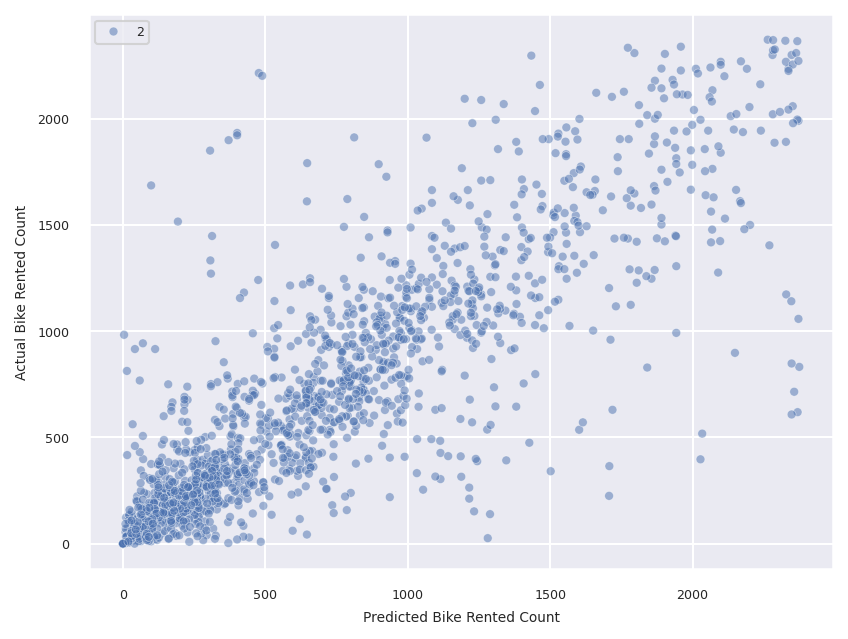

In [125]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming y_predict and y_test are Series or arrays
df_results = pd.DataFrame({'Predicted Bike Rented Count': y_predict, 'Actual Bike Rented Count': y_test})

# Create the scatter plot
sns.scatterplot(data=df_results, x='Predicted Bike Rented Count', y='Actual Bike Rented Count', size=2, alpha=0.5)

plt.ylabel('Actual Bike Rented Count')
plt.xlabel('Predicted Bike Rented Count')
plt.show()

<ipython-input-126-67208c1eebc7>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(((y_test)- (y_predict)),bins=20,color='r')


Text(0.5, 0.98, 'Residual Analysis')

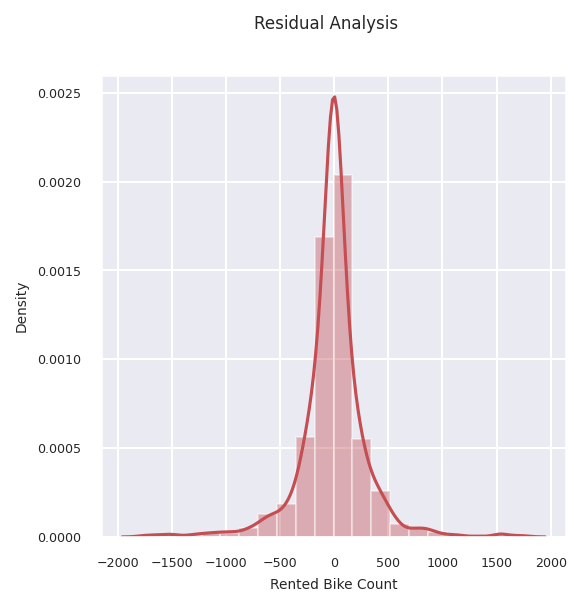

In [126]:
  # Residual KDE plot for Decision Tree
  fig=plt.figure(figsize=(4,4))

  sns.distplot(((y_test)- (y_predict)),bins=20,color='r')

  #Plot Label
  fig.suptitle('Residual Analysis', fontsize = 8)

In [127]:
import xgboost as xgb

In [128]:
xgb=xgb.XGBRegressor( colsample_bylevel=1,
       colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
       max_delta_step=0, max_depth=6, min_child_weight=8, missing=None,
       n_estimators=100, n_jobs=1, nthread=None,
       objective="reg:linear", random_state=0, reg_alpha=0,
       reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
       subsample=1, verbosity=1)

In [129]:
xgb.fit(x_train,y_train)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [13:20:26] WARNING: /workspace/src/objective/regression_obj.cu:227: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)


XGBRegressor(base_score=None, booster=None, callbacks=None, colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, device=None,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, feature_types=None, gamma=0, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=0, max_depth=6,
             max_leaves=None, min_child_weight=8, missing=None,
             monotone_constraints=None, multi_strategy=None, n_estimators=100,
             n_jobs=1, nthread=None, num_parallel_tree=None, ...)

In [131]:
import xgboost as xgb
import numpy as np # Added import for numpy

xgb=xgb.XGBRegressor( colsample_bylevel=1,
 colsample_bynode=1, colsample_bytree=1, gamma=0, learning_rate=0.1,
 max_delta_step=0, max_depth=6, min_child_weight=8, missing=np.nan, # Changed missing to np.nan
 n_estimators=100, n_jobs=1, nthread=None,
 objective="reg:linear", random_state=0, reg_alpha=0,
 reg_lambda=1, scale_pos_weight=1, seed=None, silent=None,
 subsample=1, verbosity=1)

xgb.fit(x_train,y_train)

xgb.score(x_train,y_train)

/usr/local/lib/python3.10/dist-packages/xgboost/core.py:158: UserWarning: [13:23:27] WARNING: /workspace/src/objective/regression_obj.cu:227: reg:linear is now deprecated in favor of reg:squarederror.
  warnings.warn(smsg, UserWarning)


0.9131313467680356

In [132]:
xgb.score(x_test,y_test)

0.8457154123559174

In [133]:
# Validating Assumptions
y_train_pred_xgb = xgb.predict(x_train)
y_test_pred_xgb = xgb.predict(x_test)

print(y_train_pred_xgb)

[ 294.40555 1686.733   2080.778   ...  408.5535   231.32428  359.36923]


In [134]:

def print_metrics(actual, predicted):
  print('MSE is {}'.format(mean_squared_error(actual, predicted)))
  print('RMSE is {}'.format(math.sqrt(mean_squared_error(actual, predicted))))
  print('MAE is {}'.format(mean_absolute_error(actual, predicted)))



In [135]:
# Evaluation of training Data
print_metrics(y_test, y_test_pred_xgb)

#Find R-squared value
r2 = r2_score(y_test, y_test_pred_xgb)
  # Find Adjusted R-squared value
adj_r2=1-(1-r2_score(y_test, y_test_pred_xgb))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1))
print(f"r2:{r2}")
print(f"Adj_r2:{adj_r2}")

MSE is 53409.00220540275
RMSE is 231.10387752134915
MAE is 150.29582398766215
r2:0.8457154123559174
Adj_r2:0.844540427212758


Text(0, 0.5, 'Predicted Count of Rented Bikes')

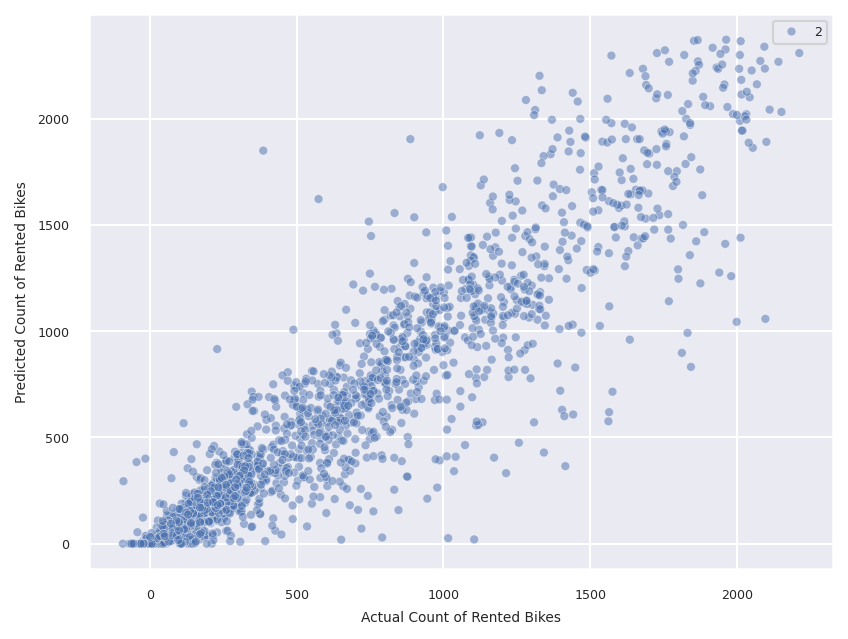

In [137]:
# Predicted vs Actual plot for Xg boost
sns.scatterplot(x=y_test_pred_xgb, y=y_test, size  = 2, alpha = 0.5) # Pass variables as keyword arguments x and y
plt.xlabel('Actual Count of Rented Bikes')
plt.ylabel('Predicted Count of Rented Bikes')

<ipython-input-138-4c5d58103717>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(((y_test)- (y_test_pred_xgb)),bins=20,color='r')


Text(0.5, 0.98, 'Residual Analysis')

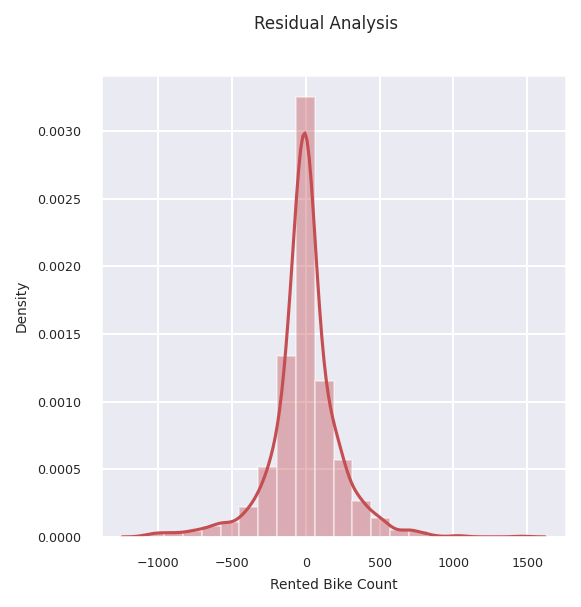

In [138]:
# Residual KDE plot for xg boost
fig=plt.figure(figsize=(4,4))

sns.distplot(((y_test)- (y_test_pred_xgb)),bins=20,color='r')

#Plot Label
fig.suptitle('Residual Analysis', fontsize = 8)

In [139]:
from sklearn.ensemble import RandomForestRegressor
regressor1 = RandomForestRegressor(n_estimators = 100, random_state = 0)
regressor1.fit(x_train, y_train)

RandomForestRegressor(random_state=0)

In [140]:
y_predict_rf = regressor1.predict(x_test)

In [141]:
# Metrics for Random Forest
MSE_rf  = mean_squared_error((y_test), (y_predict_rf))
print("MSE :" , MSE_rf)

MAE_rf= mean_absolute_error((y_test),(y_predict_rf))
print("MAE :" ,MAE_rf)

RMSE_rf = np.sqrt(MSE_rf)
print("RMSE :" ,RMSE_rf)

MSE : 53744.9561817548
MAE : 149.6847414294015
RMSE : 231.8295843540138


In [142]:
# Accuracy of Randomg FOrest
r2 = r2_score((y_test), (y_predict_rf))
print("R2 :" ,r2)
print("Adjusted R2 : ",1-(1-r2_score((y_test), (y_predict_rf)))*((x_test.shape[0]-1)/(x_test.shape[0]-x_test.shape[1]-1)))

R2 : 0.8447449295053012
Adjusted R2 :  0.8435625534558395


Text(0, 0.5, 'Predicted Count of Rented Bikes')

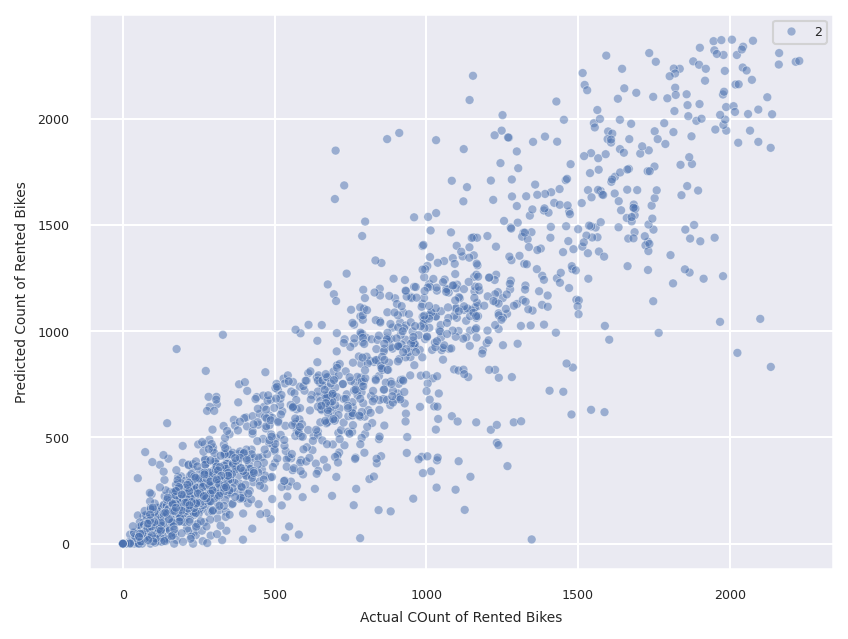

In [144]:
# Predicted vs Atucal for Random forest
sns.scatterplot(x=y_predict_rf, y=y_test, size  = 2, alpha = 0.5) # Pass x and y as keyword arguments.
plt.xlabel('Actual COunt of Rented Bikes')
plt.ylabel('Predicted Count of Rented Bikes')

<ipython-input-145-bc0f9763f723>:4: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(((y_test)- (y_predict_rf)),bins=20,color='r')


Text(0.5, 0.98, 'Residual Analysis')

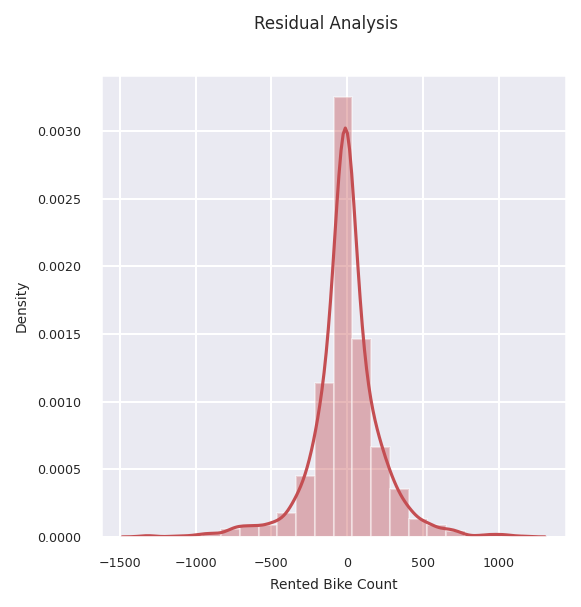

In [145]:
# Residual plot for Random Forest
fig=plt.figure(figsize=(4,4))

sns.distplot(((y_test)- (y_predict_rf)),bins=20,color='r')

#Plot Label
fig.suptitle('Residual Analysis', fontsize = 8)

In [146]:
# Calculating  the feature importance
feature_names = x_train.columns
feature_imp = pd.DataFrame({'cols':feature_names, 'imp':regressor1.feature_importances_}).sort_values('imp', ascending=False).reset_index()
feature_imp

,index,cols,imp
0,1,Temperature(?),0.336112
1,0,Hour,0.268909
2,6,Solar Radiation (MJ/m2),0.077304
3,2,Humidity(%),0.070774
4,7,Rainfall(mm),0.061104
5,11,Functioning Day_No,0.050301
6,12,Functioning Day_Yes,0.047159
7,5,Dew point temperature(?),0.033848
8,4,Visibility (10m),0.027682
9,3,Wind speed (m/s),0.022795


from matplotlib import pyplot as plt
_df_4['level_0'].plot(kind='hist', bins=20, title='level_0')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6['imp'].plot(kind='hist', bins=20, title='imp')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_7.plot(kind='scatter', x='level_0', y='index', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_8.plot(kind='scatter', x='index', y='imp', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['level_0']
  ys = series['index']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_9.sort_values('level_0', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('level_0')
_ = plt.ylabel('index')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['level_0']
  ys = series['imp']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_10.sort_values('level_0', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('level_0')
_ = plt.ylabel('imp')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['level_0']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'level_0'}, axis=1)
              .sort_values('level_0', ascending=True))
  xs = counted['level_0']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_11.sort_values('level_0', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('level_0')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_12['level_0'].plot(kind='line', figsize=(8, 4), title='level_0')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_13['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_14['imp'].plot(kind='line', figsize=(8, 4), title='imp')
plt.gca().spines[['top', 'right']].set_visible(False)

<Axes: xlabel='imp', ylabel='cols'>

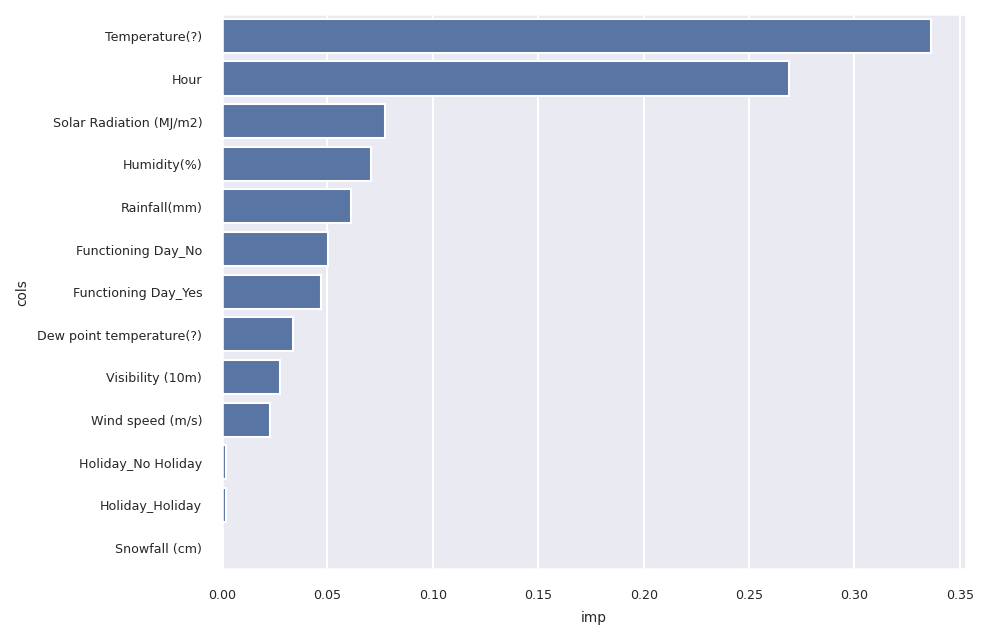

In [147]:
# Visualizing the Feature importance
sns.barplot(data = feature_imp, y = 'cols', x = 'imp')

In [148]:
# Summary table of ML models
from prettytable import PrettyTable
data_table = PrettyTable(['SL NO',"MODEL_NAME", "MSE", "RMSE","MAE",'R^2','Adjusted R^2'])
data_table.add_row(['1','Linear Regression','155676.033','394.558','301.067','0.550','0.545'])
data_table.add_row(['2','Lasso Regression','155673.688','394.555','301.060','0.550','0.545'])
data_table.add_row(['3','Gride Search CV',' 155675.866','394.557','301.067','0.550','0.545'])
data_table.add_row(['4','Decision Tree','83584.743','289.110','164.456',"0.754",'0.751'])
data_table.add_row(['6','Default_XG boost','44091.547','209.979','131.553','0.872','0.871'])
data_table.add_row(['7','Random Forest','42747.144','206.753','128.211',"0.876",'0.875'])
print(data_table)

+-------+-------------------+-------------+---------+---------+-------+--------------+
| SL NO |     MODEL_NAME    |     MSE     |   RMSE  |   MAE   |  R^2  | Adjusted R^2 |
+-------+-------------------+-------------+---------+---------+-------+--------------+
|   1   | Linear Regression |  155676.033 | 394.558 | 301.067 | 0.550 |    0.545     |
|   2   |  Lasso Regression |  155673.688 | 394.555 | 301.060 | 0.550 |    0.545     |
|   3   |  Gride Search CV  |  155675.866 | 394.557 | 301.067 | 0.550 |    0.545     |
|   4   |   Decision Tree   |  83584.743  | 289.110 | 164.456 | 0.754 |    0.751     |
|   6   |  Default_XG boost |  44091.547  | 209.979 | 131.553 | 0.872 |    0.871     |
|   7   |   Random Forest   |  42747.144  | 206.753 | 128.211 | 0.876 |    0.875     |
+-------+-------------------+-------------+---------+---------+-------+--------------+
